# Reinforcement Learning on TPU


<center>
<img src="https://raw.githubusercontent.com/jcformanek/jcformanek.github.io/master/docs/assets/images/rl_in_space.png" width="80%" />
</center>

**Authors:**
Clément Bonnet, Paul Duckworth

**With Thanks:**
Claude Formanek, Kale-ab Tessera, Sicelukwanda Zwane, Sebastian Bodenstein

<br/>

**Introduction**: Industries are full of complex problems, most of which are sequential and require decision-making. E.g. logistics, manufacture, energy, inventory, etc. AI, more sepcifically, Reinforcement Learning (RL) can help us!

**Aim**: To understand how to use Reinforcement Learning in the cloud to solve industrial decision-making problems.

**Plan**:
- Introduce key concepts in RL
- Formalise decision-making problems using Markov decision processes
- Real-world example: use RL and TPUs to train an agent capable of solving a challenging logistics problem

## Setup

In [1]:
# @title Install Jumanji (run me) { display-mode: "form" }
# @markdown This may take a minute or two to complete.
%%capture
!pip install jumanji[train]

In [2]:
# @title Set up JAX for available hardware (run me) { display-mode: "form" }

import subprocess
import os

# Based on https://stackoverflow.com/questions/67504079/how-to-check-if-an-nvidia-gpu-is-available-on-my-system
try:
    subprocess.check_output('nvidia-smi')
    print("a GPU is connected.")
except Exception:
    # TPU or CPU
    if "COLAB_TPU_ADDR" in os.environ and os.environ["COLAB_TPU_ADDR"]:
        import jax.tools.colab_tpu
        jax.tools.colab_tpu.setup_tpu()
        print("A TPU is connected.")
    else:
        print("Only CPU accelerator is connected.")
        # x8 cpu devices - number of (emulated) host devices
        os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=8"

A TPU is connected.


In [3]:
# @title Import required packages (run me) { display-mode: "form" }
import jax
import jax.numpy as jnp
import jumanji
from jumanji.environments import BinPack
from jumanji.environments.packing.bin_pack.generator import RandomGenerator

from google.colab import output
output.enable_custom_widget_manager()

# Hide warnings
import warnings
warnings.filterwarnings('ignore')

---
## **Key Concepts in Reinforcement Learning**

Reinforcement Learning (RL) is a subfield of Machine Learning (ML), that focuses on *goal-orientated* learning from sequences of interactions, via trial-and-error.

The goal is to learn what to do (i.e. which actions to take) in a given situation to maximise some reward signal.

-> Reinforcement Learning Loop:

<center>
<img src="https://miro.medium.com/max/1400/1*Ews7HaMiSn2l8r70eeIszQ.png" width="40%" />
</center>

<br/>

More precisely:

&nbsp; &nbsp; 1) we have an **agent** which perceives an **observation** $o_t$ of the current state $s_t$ of the **environment**.

&nbsp; &nbsp; 2) It must choose an **action** $a_t$ to take.

&nbsp; &nbsp; 3) The environment then **transitions** to a new state $s_{t+1}$ in response to the action.

&nbsp; &nbsp; 4) It also provides the agent a **reward** $r_t$ to indicate how good or bad the chosen action was given the environment's state.


[*Image Source*](https://towardsdatascience.com/multi-agent-deep-reinforcement-learning-in-15-lines-of-code-using-pettingzoo-e0b963c0820b)

---

---
## **Decision Making Problems**


Real-world sequential decision making problems can be represented as simulated environments for the purpose of AI development.

At Instadeep, we've built a collection of **industry-inspired combinatorial problems** into a benchmark suite of RL environments:

<br/>
<center>
<img src="https://github.com/instadeepai/jumanji/raw/main/docs/img/jumanji_logo.png" width="40%" />
</center>
<br/>

<div class="collage">
  <div class="row" align="center">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/bin_pack.gif" alt="BinPack" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/cleaner.gif" alt="Cleaner" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/connector.gif" alt="Connector" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/cvrp.gif" alt="CVRP" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/game_2048.gif" alt="Game2048" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/graph_coloring.gif" alt="GraphColoring" width="16%">
  </div>
  <div class="row" align="center">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/job_shop.gif" alt="JobShop" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/knapsack.gif" alt="Knapsack" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/maze.gif" alt="Maze" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/minesweeper.gif" alt="Minesweeper" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/mmst.gif" alt="MMST" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/multi_cvrp.gif" alt="MultiCVRP" width="16%">
  </div>
  <div class="row" align="center">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/robot_warehouse.gif" alt="RobotWarehouse" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/rubiks_cube.gif" alt="RubiksCube" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/snake.gif" alt="Snake" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/sudoku.gif" alt="Sudoku" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/tetris.gif" alt="Tetris" width="16%">
    <img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/tsp.gif" alt="Tetris" width="16%">
  </div>
</div>

[*Link to Jumanji*](https://github.com/instadeepai/jumanji)
---

---
### **Formalising Decision Making**

We can formally define a sequential decision making problem as a Markov decision process (MDP):  $\mathcal{M} = (S, A, \mu, P, R)$, with components:

- $S$ is the space of all possible states,

- $A$ is the space of all possible actions available to the agent,

- $\mu$ is a distribution of initial states,

- $P$ is the environment transition dynamics,

- $R$ is the reward function.
<br/>

---
<br/>

At time step $t$, an action $a_t$ transitions the environment from the current state $s_t$ to the next state $s_{t+1}$ as defined by the environment dynamics $P$, resulting in a reward $r_{t}$.
<br/>

<center>
<img src="https://miro.medium.com/v2/resize:fit:1400/1*1o1oeH3vpzsfJukLbFsekw.png" width="70%" />
</center>


We generate **a trajectory** from an MDP by rolling out the environment dynamics for multiple timesteps:  $(s_0, a_0, r_0,$ &nbsp; $s_1, a_1, r_1$, &nbsp; $\dots$, &nbsp; $s_{t}, a_{t}, r_{t})$ where $s_0 \sim \mu$.

<br/>

---

<!-- The **objective of an agent** is often to maximize the (discounted) *expected return*, which is given by $\mathbb{E}_{a_t \sim \pi(\cdot|s_t)} [\sum_{t=0}^T \gamma^t  r(s_t, a_t)]$, where $\gamma \in (0,1)$ is the discount factor (that applies more emphasis to earlier rewards than later rewarsd) and $\pi$ is the agent's policy.  -->


---
### **Real World Example**

Bin Packing is a real-world sequential decision making problem.
The goal is to efficiently pack a set of boxes (items) of different sizes into a single container with as little empty space as possible.

<br/>

<center>
<img src="https://github.com/instadeepai/jumanji/raw/main/docs/env_anim/bin_pack.gif" alt="BinPack" width="30%">
</center>

As the box and number of items grow, the problem becomes non-trivial. We require AI agents with massive compute to help.

[DeepPack](https://www.deeppack.ai/)

---

- 💡 Think of an example of a sequential task that can be framed as an MDP and hence solved using RL (think of $S, A, \mu, P, R$)

- Let's dive into the Bin Packing example in the meantime

---

In [4]:
BIN_PACK_SEED = 1

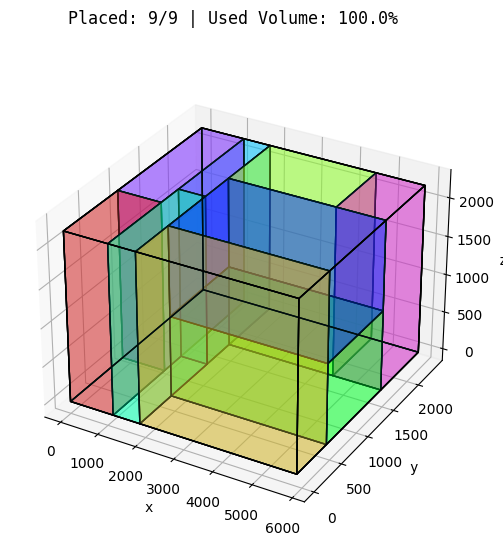

In [5]:
env = BinPack(
    generator=RandomGenerator(
        max_num_items=10,
        max_num_ems=15,
        split_num_same_items=2,
        ),
    obs_num_ems=15,
)
reset_fn = jax.jit(env.reset)
step_fn = jax.jit(env.step)
generate_solution_fn = jax.jit(env.generator.generate_solution)

# Reset the environment
key = jax.random.PRNGKey(BIN_PACK_SEED)
initial_state, initial_timestep = reset_fn(key)

# Render the initial state
env.render(initial_state)

# Render the solution
solution = generate_solution_fn(key)
env.render(solution)

---
### **Bin Packing MDP**: $(S, A, \mu, P, R)$:

- **State** $S$: An agent perceives an observation $o_t$ of the current environment state $s_t$, which contains information on:

  - the **available empty space** (called EMSs) in the current state, via an EMS mask.

  - the **items** that still need to be packed, along with a list of **items placed** already

  - information on what **actions are valid** in this state


<!-- In some settings, the observation may include all the information underlying the environment's state. Such an environment is called **fully observed**. In other settings, the agent may only receive partial information about the environment's state in its observation. Such an environment is called **partially observed**.
For the rest of this tutorial, we will assume the environment is fully observed and so the observation contains all the information in state $s_t$, so can use them interchangeably.  -->

- **Actions** $A$: the set of actions available to the agent, i.e. what item to pack and where to pack it (into what space).

- **Initial state distribution** $\mu$: the empty container and the list of items to pack.

- **State transition function** $P$ takes the current state $s_t$ and an action $a_t$ as input and returns the next state $s_{t+1}$ as output $s_{t+1}=P(s_t, a_t)$. Given a location of where to pack an item, the transition means packing the item and returning the new possible spaces in the container.

- **Reward function** $R$: the volume utilisation of the item packed by taking the chosen action.


### States: $S$

In [6]:
# Reset the environment: Initial State
key = jax.random.PRNGKey(BIN_PACK_SEED)
initial_state, initial_timestep = reset_fn(key)

observation_shapes = jax.tree_util.tree_map(lambda x: x.shape, initial_timestep.observation)
print("Initial observation", observation_shapes)

Initial observation Observation(ems=Space(
	x1=(15,), x2=(15,),
	y1=(15,), y2=(15,),
	z1=(15,), z2=(15,),
), ems_mask=(15,), items=Item(x_len=(10,), y_len=(10,), z_len=(10,)), items_mask=(10,), items_placed=(10,), action_mask=(15, 10))


### Actions: $A$

In BinPack we have a multi-dimensional set of discrete actions that
represent the ID of an EMS (the **space**) and the ID of an **item**. For instance, [1, 5] will place item 5 in EMS 1.

In [7]:
## Actions
print(f"Action specifications:", env.action_spec())

Action specifications: MultiDiscreteArray(shape=(2,), dtype=dtype('int32'), name='action', minimum=DeviceArray([0, 0], dtype=int32), maximum=DeviceArray([14,  9], dtype=int32), num_values=DeviceArray([15, 10], dtype=int32))


### Transition Function: $P$





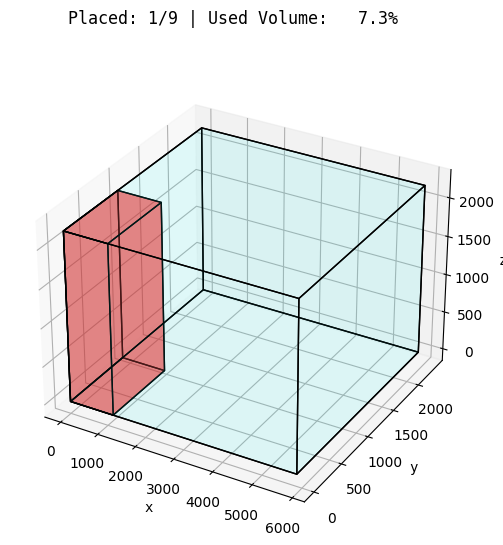

In [8]:
# Get the initial obs by resetting the env
key = jax.random.PRNGKey(BIN_PACK_SEED)
initial_state, initial_timestep = reset_fn(key)

# Take an action from the enviroment's action spec
action = env.action_spec().generate_value()

next_state, timestep = step_fn(initial_state, action)

# Render the new state
env.render(next_state)

### Reward $R$

In [9]:
print(f"Reward: {timestep.reward.item():.3f}")

Reward: 0.073


### **Training an Agent to Solve the MDP**

### Agent's Policy - $\pi$

An agent chooses actions based on observations it receives.

We can think of the agent's action selection process as a function that takes an observation as input and returns an action as output.

We call this function the agent's **policy** and denote it $\pi(s_t)=a_t$.

In RL, we usually parametrise our policy in some way and then try to learn the optimal parameters.

<!-- A parametrised policy is usually denoted $\pi_\theta$, where $\theta$ is the set of parameters. -->



### Episode Return - $G_t$

In RL we usually break an agent's interactions with the environment up into **episodes**.The sum of all rewards collected during an episode is what we call the episode's **return** - $G_t$:

<center>
$G_t=\sum_{t=0}^Tr_t$,
</center>

where $r_t$ is the reward at time $t$ and $T$ is the last timestep. The goal in RL is for the agent to chose actions which maximise this expected future return $G_t$.


### Select a few random actions

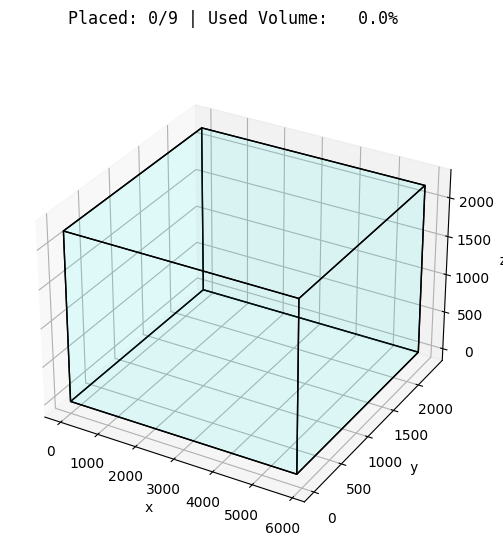

In [10]:
from jumanji.training import networks

random_policy = networks.make_random_policy_bin_pack(env.unwrapped)

@jax.jit
def select_random_action(observation, key):
    """Call `random_policy` which expects a batch of observations."""
    batched_observation = jax.tree_util.tree_map(lambda x: x[None], observation)
    return random_policy(batched_observation, key).squeeze(axis=0)

def print_available_actions(observation):
    actions = [
        [space, item]
        for space, spaces in enumerate(observation.action_mask)
        for item, valid in enumerate(spaces) if valid
    ]
    print("Available actions:", actions)

key = jax.random.PRNGKey(BIN_PACK_SEED)
state, timestep = reset_fn(key)
env.render(state)

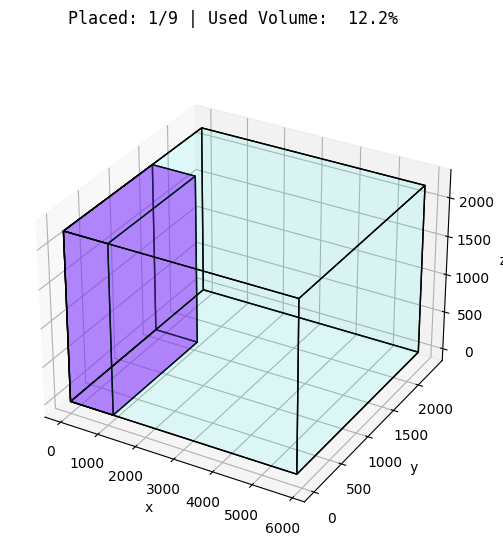

Available actions: [[0, 0], [0, 1], [0, 2], [0, 3], [0, 4], [0, 5], [0, 6], [0, 7], [0, 8]]
Selected action: [0 7]


In [11]:
# Select an action.
action_key, key = jax.random.split(key)
observation = timestep.observation
action = select_random_action(observation, action_key)

# Step in the environment.
state, timestep = step_fn(state, action)
env.render(state)
print_available_actions(observation)
print("Selected action:", action)

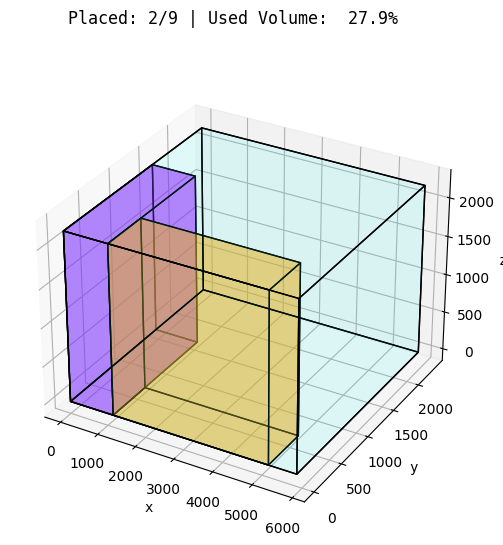

Available actions: [[0, 0], [0, 1], [0, 2], [0, 3], [0, 4], [0, 5], [0, 6], [0, 8], [1, 0], [1, 1], [1, 2], [1, 8]]
Selected action: [0 1]


In [12]:
# Select an action.
action_key, key = jax.random.split(key)
observation = timestep.observation
action = select_random_action(observation, action_key)

# Step in the environment.
state, timestep = step_fn(state, action)
env.render(state)
print_available_actions(observation)
print("Selected action:", action)

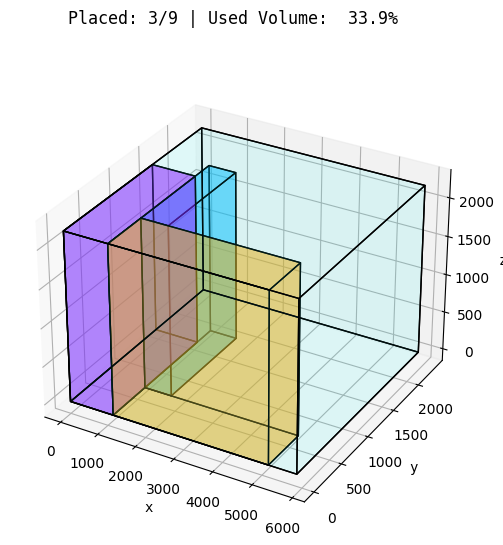

Available actions: [[0, 0], [0, 2], [0, 3], [0, 4], [0, 5], [0, 6], [0, 8], [1, 0], [1, 2], [1, 8], [2, 4], [2, 5]]
Selected action: [0 5]


In [13]:
# Select an action.
action_key, key = jax.random.split(key)
observation = timestep.observation
action = select_random_action(observation, action_key)

# Step in the environment.
state, timestep = step_fn(state, action)
env.render(state)
print_available_actions(observation)
print("Selected action:", action)

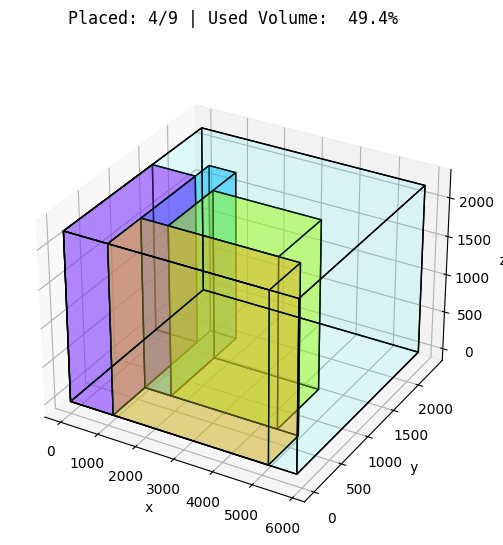

Available actions: [[0, 0], [0, 2], [0, 3], [0, 4], [0, 6], [0, 8], [2, 4], [3, 0]]
Selected action: [0 2]


In [14]:
# Select an action.
action_key, key = jax.random.split(key)
observation = timestep.observation
action = select_random_action(observation, action_key)

# Step in the environment.
state, timestep = step_fn(state, action)
env.render(state)
print_available_actions(observation)
print("Selected action:", action)

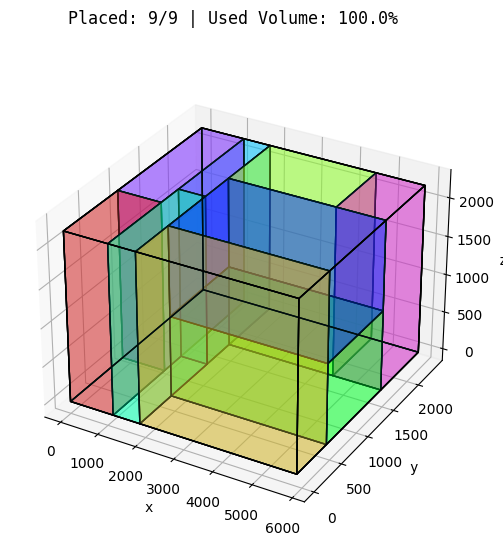

In [15]:
# Render the solution
solution = generate_solution_fn(jax.random.PRNGKey(BIN_PACK_SEED))
env.render(solution)

In [16]:
#@title Rollout a few episodes (run me) { display-mode: "form" }

reset_key = jax.random.PRNGKey(BIN_PACK_SEED)
key = jax.random.PRNGKey(0)
states = [state]

for episode in range(3):
    state, timestep = reset_fn(reset_key)
    # Loop until the episode is done.
    while not timestep.last():
        # Select an action.
        action_key, key = jax.random.split(key)
        action = select_random_action(timestep.observation, action_key)
        # Step in the environment.
        state, timestep = step_fn(state, action)
        states.append(state)
    states += 5*[state]

env.animate(states, interval=400)


---
In BinPack, the environment is considered solved when the agent can reliably pack all the items into the space.

As you can see, our random policy is far from optimal.

Jumanji provides a training loop to train an agent to be better at maximising the rewards it receives in the task.

### **Break** -> launch training

What are some examples of tasks that require sequential decision-making in your industries?

- $S$ space of all possible states

- $A$: space of all possible actions

- $\mu$: possible initial states

- $P$: environment transition dynamics

- $R$: reward function

---

### Agent-environment Loop

We can train an agent on TPU by repeating the following process:
1. collect transitions by sampling actions and stepping into the environment
2. update the policy parameters to optimise the reward on the batch of data just collected

All of this can happen on the hardware accelerator (e.g. TPU) using the Anakin framework [*Hessel et al., 2021*] to maximise throughput.

In [17]:
#@title Download Jumanji Configs (run me) { display-mode: "form" }

import os
import requests

def download_file(url: str, file_path: str) -> None:
    # Send an HTTP GET request to the URL
    response = requests.get(url)
    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        with open(file_path, "wb") as f:
            f.write(response.content)
    else:
        print("Failed to download the file.")

os.makedirs("configs", exist_ok=True)
config_url = "https://raw.githubusercontent.com/instadeepai/jumanji/main/jumanji/training/configs/config.yaml"
download_file(config_url, "configs/config.yaml")
bin_pack_url = "https://raw.githubusercontent.com/instadeepai/jumanji/main/jumanji/training/configs/env/bin_pack.yaml"
os.makedirs("configs/env", exist_ok=True)
download_file(bin_pack_url, "configs/env/bin_pack.yaml")

In [18]:
#@title Setup training (run me) { display-mode: "form" }

# This code is copied from jumanji https://github.com/instadeepai/jumanji

from typing import Tuple

import chex
import jax
import jax.numpy as jnp
import optax
from omegaconf import DictConfig

import jumanji
from jumanji.env import Environment
from jumanji.environments import BinPack
from jumanji.environments.packing.bin_pack.generator import RandomGenerator
from jumanji.training import networks
from jumanji.training.agents.a2c import A2CAgent
from jumanji.training.agents.base import Agent
from jumanji.training.agents.random import RandomAgent
from jumanji.training.evaluator import Evaluator
from jumanji.training.loggers import (
    Logger,
    NoOpLogger,
    TensorboardLogger,
    TerminalLogger,
)
from jumanji.training.networks.actor_critic import ActorCriticNetworks
from jumanji.training.networks.protocols import RandomPolicy
from jumanji.training.types import ActingState, TrainingState
from jumanji.wrappers import VmapAutoResetWrapper


def setup_logger(cfg: DictConfig) -> Logger:
    logger: Logger
    # Log only once if there are multiple hosts on the pod.
    if jax.process_index() != 0:
        return NoOpLogger()
    if cfg.logger.type == "tensorboard":
        logger = TensorboardLogger(
            name=cfg.logger.name, save_checkpoint=cfg.logger.save_checkpoint
        )
    elif cfg.logger.type == "terminal":
        logger = TerminalLogger(
            name=cfg.logger.name, save_checkpoint=cfg.logger.save_checkpoint
        )
    else:
        raise ValueError(
            f"logger expected in ['tensorboard', 'terminal'], got {cfg.logger}."
        )
    return logger


def _make_raw_env(cfg: DictConfig) -> Environment:
    # env = jumanji.make(cfg.env.registered_version)
    env = BinPack(
        generator=RandomGenerator(
            max_num_items=10,
            max_num_ems=15,
            split_num_same_items=2,
            ),
        obs_num_ems=15,
    )
    return env


def setup_env(cfg: DictConfig) -> Environment:
    env = _make_raw_env(cfg)
    env = VmapAutoResetWrapper(env)
    return env


def setup_agent(cfg: DictConfig, env: Environment) -> Agent:
    agent: Agent
    if cfg.agent == "random":
        random_policy = _setup_random_policy(cfg, env)
        agent = RandomAgent(
            env=env,
            n_steps=cfg.env.training.n_steps,
            total_batch_size=cfg.env.training.total_batch_size,
            random_policy=random_policy,
        )
    elif cfg.agent == "a2c":
        actor_critic_networks = _setup_actor_critic_neworks(cfg, env)
        optimizer = optax.adam(cfg.env.a2c.learning_rate)
        agent = A2CAgent(
            env=env,
            n_steps=cfg.env.training.n_steps,
            total_batch_size=cfg.env.training.total_batch_size,
            actor_critic_networks=actor_critic_networks,
            optimizer=optimizer,
            normalize_advantage=cfg.env.a2c.normalize_advantage,
            discount_factor=cfg.env.a2c.discount_factor,
            bootstrapping_factor=cfg.env.a2c.bootstrapping_factor,
            l_pg=cfg.env.a2c.l_pg,
            l_td=cfg.env.a2c.l_td,
            l_en=cfg.env.a2c.l_en,
        )
    else:
        raise ValueError(
            f"Expected agent name to be in ['random', 'a2c'], got {cfg.agent}."
        )
    return agent


def _setup_random_policy(
    cfg: DictConfig, env: Environment
) -> RandomPolicy:
    assert cfg.agent == "random"
    if cfg.env.name == "bin_pack":
        assert isinstance(env.unwrapped, BinPack)
        random_policy = networks.make_random_policy_bin_pack(bin_pack=env.unwrapped)
    else:
        raise ValueError(f"Environment name not found. Got {cfg.env.name}.")
    return random_policy


def _setup_actor_critic_neworks(
    cfg: DictConfig, env: Environment
) -> ActorCriticNetworks:
    assert cfg.agent == "a2c"
    if cfg.env.name == "bin_pack":
        assert isinstance(env.unwrapped, BinPack)
        actor_critic_networks = networks.make_actor_critic_networks_bin_pack(
            bin_pack=env.unwrapped,
            num_transformer_layers=cfg.env.network.num_transformer_layers,
            transformer_num_heads=cfg.env.network.transformer_num_heads,
            transformer_key_size=cfg.env.network.transformer_key_size,
            transformer_mlp_units=cfg.env.network.transformer_mlp_units,
        )
    else:
        raise ValueError(f"Environment name not found. Got {cfg.env.name}.")
    return actor_critic_networks


def setup_evaluator(cfg: DictConfig, agent: Agent) -> Evaluator:
    env = _make_raw_env(cfg)
    stochastic_eval = Evaluator(
        eval_env=env,
        agent=agent,
        total_batch_size=cfg.env.evaluation.eval_total_batch_size,
        stochastic=True,
    )
    return stochastic_eval


def setup_training_state(
    env: Environment, agent: Agent, key: chex.PRNGKey
) -> TrainingState:
    params_key, reset_key, acting_key = jax.random.split(key, 3)

    # Initialize params.
    params_state = agent.init_params(params_key)

    # Initialize environment states.
    num_local_devices = jax.local_device_count()
    num_global_devices = jax.device_count()
    num_workers = num_global_devices // num_local_devices
    local_batch_size = agent.total_batch_size // num_global_devices
    reset_keys = jax.random.split(reset_key, agent.total_batch_size).reshape(
        (
            num_workers,
            num_local_devices,
            local_batch_size,
            -1,
        )
    )
    reset_keys_per_worker = reset_keys[jax.process_index()]
    env_state, timestep = jax.pmap(env.reset, axis_name="devices")(
        reset_keys_per_worker
    )

    # Initialize acting states.
    acting_key_per_device = jax.random.split(acting_key, num_global_devices).reshape(
        num_workers, num_local_devices, -1
    )
    acting_key_per_worker_device = acting_key_per_device[jax.process_index()]
    acting_state = ActingState(
        state=env_state,
        timestep=timestep,
        key=acting_key_per_worker_device,
        episode_count=jnp.zeros(num_local_devices, float),
        env_step_count=jnp.zeros(num_local_devices, float),
    )

    # Build the training state.
    training_state = TrainingState(
        params_state=jax.device_put_replicated(params_state, jax.local_devices()),
        acting_state=acting_state,
    )
    return training_state


In [19]:
#@title Training (run me) { display-mode: "form" }
# @markdown This may take a while.

from jumanji.training.train import train
import hydra

with hydra.initialize(version_base=None, config_path="configs"):
    cfg = hydra.compose(
        config_name="config.yaml",
        overrides=[
            "env=bin_pack",
            "agent=a2c",
            "logger.type=terminal",
            "logger.save_checkpoint=true",
            "env.training.num_epochs=10",
            "env.training.num_learner_steps_per_epoch=100",
            "env.training.n_steps=30",
            "env.training.total_batch_size=64",
            "env.evaluation.eval_total_batch_size=4000",
            "env.evaluation.greedy_eval_total_batch_size=0",
        ],
    )

import functools
import logging
from typing import Dict, Tuple

import hydra
import jax
import jax.numpy as jnp
import omegaconf
from tqdm.auto import trange

from jumanji.training import utils
from jumanji.training.agents.random import RandomAgent
from jumanji.training.loggers import TerminalLogger
from jumanji.training.timer import Timer
from jumanji.training.types import TrainingState


logging.info(omegaconf.OmegaConf.to_yaml(cfg))
logging.getLogger().setLevel(logging.INFO)
logging.info({"devices": jax.local_devices()})

key, init_key = jax.random.split(jax.random.PRNGKey(cfg.seed))
logger = setup_logger(cfg)
env = setup_env(cfg)
agent = setup_agent(cfg, env)
evaluator = setup_evaluator(cfg, agent)
training_state = setup_training_state(env, agent, init_key)
num_steps_per_epoch = (
    cfg.env.training.n_steps
    * cfg.env.training.total_batch_size
    * cfg.env.training.num_learner_steps_per_epoch
)
timer = Timer(out_var_name="metrics")

@functools.partial(jax.pmap, axis_name="devices")
def epoch_fn(training_state: TrainingState) -> Tuple[TrainingState, Dict]:
    training_state, metrics = jax.lax.scan(
        lambda training_state, _: agent.run_epoch(training_state),
        training_state,
        None,
        cfg.env.training.num_learner_steps_per_epoch,
    )
    metrics = jax.tree_util.tree_map(jnp.mean, metrics)
    return training_state, metrics

with logger:
    for i in trange(
        cfg.env.training.num_epochs,
        disable=isinstance(logger, TerminalLogger),
    ):
        env_steps = i * num_steps_per_epoch

        key, eval_key, = jax.random.split(key)
        # Evaluation
        with timer:
            metrics = evaluator.run_evaluation(
                training_state.params_state, eval_key
            )
            jax.block_until_ready(metrics)
        logger.write(
            data=utils.first_from_device(metrics),
            label="eval",
            env_steps=env_steps,
        )

        # Training
        with timer:
            training_state, metrics = epoch_fn(training_state)
            jax.block_until_ready((training_state, metrics))
        logger.write(
            data=utils.first_from_device(metrics),
            label="train",
            env_steps=env_steps,
        )


INFO:root:{'devices': [TpuDevice(id=0, process_index=0, coords=(0,0,0), core_on_chip=0), TpuDevice(id=1, process_index=0, coords=(0,0,0), core_on_chip=1), TpuDevice(id=2, process_index=0, coords=(1,0,0), core_on_chip=0), TpuDevice(id=3, process_index=0, coords=(1,0,0), core_on_chip=1), TpuDevice(id=4, process_index=0, coords=(0,1,0), core_on_chip=0), TpuDevice(id=5, process_index=0, coords=(0,1,0), core_on_chip=1), TpuDevice(id=6, process_index=0, coords=(1,1,0), core_on_chip=0), TpuDevice(id=7, process_index=0, coords=(1,1,0), core_on_chip=1)]}
INFO:root:Experiment: a2c_bin_pack.
INFO:root:Starting logger.
INFO:root:Eval >> Env Steps: 0.00e+00 | Active Ems: 6.717 | Episode Length: 7.225 | Episode Return: 0.707 | Invalid Action: 0.000 | Packed Items: 7.225 | Ratio Packed Items: 0.803 | Time: 44.561 | Volume Utilization: 0.707
INFO:root:Train >> Env Steps: 0.00e+00 | Active Ems: 2.594 | Advantage: 0.002 | Critic Loss: 0.264 | Entropy: 0.721 | Entropy Loss: -0.721 | Invalid Action: 0.000

In [20]:
# #@title Optional: load a checkpoint { display-mode: "form" }

# from huggingface_hub import hf_hub_download

# model_checkpoint = hf_hub_download(
#     repo_id="InstaDeepAI/tpu-workshop-BinPack",
#     filename="training_state",
# )

# with open(model_checkpoint, "rb") as f:
#     training_state = pickle.load(f)

In [21]:
#@title Rollout an episode after training (run me) { display-mode: "form" }

from jumanji.training import networks

policy_params = utils.first_from_device(training_state.params_state.params.actor)
policy = agent.make_policy(
    policy_params=policy_params, stochastic=True
)

@jax.jit
def select_action(observation, key):
    batched_observation = jax.tree_util.tree_map(lambda x: x[None], observation)
    action, _ = policy(batched_observation, key)
    return action.squeeze(axis=0)

key = jax.random.PRNGKey(BIN_PACK_SEED)
state, timestep = reset_fn(key)
states = [state]

# Loop until the episode is done.
while not timestep.last():
    # Select an action.
    action_key, key = jax.random.split(key)
    action = select_action(timestep.observation, action_key)
    # Step in the environment.
    state, timestep = step_fn(state, action)
    states.append(state)
states += 5*[state]

env.animate(states, interval=400)

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


## Conclusion
**Summary:**

We've covered the **basics of reinforcement learning (RL)** applied to an **industry-inspired problem**.

RL concepts such as:
- environment observations,
- action selection,
- transition functions
- rewards,
- episodes.

We learnt about rewards and that the goal in RL is to learn a policy which maximises some notion of cummulative reward that the agent receives from the environment (return).

We then used [Jumanji](https://github.com/instadeepai/jumanji)'s training loop to learn a policy via gradient decent, by adjusting the parameters of our agent's policy in the direction which maximises the expected cummulative reward (return).

You can now frame your own sequential tasks as RL problems and solve them using AI.

<br/>

<br/>


---

<br/>

**Further Reading:**

If you are looking for a more indepth online course for RL you can checkout these courses:
<!-- * [Reinforcement Learning Foundations on LinkedIn Learning](https://www.linkedin.com/learning/reinforcement-learning-foundations) (made by one of our very own tutors, Khaulat Abdulhakeem) -->
* [An introduction to Reinforcement Learning on FreeCodeCamp](https://www.freecodecamp.org/news/an-introduction-to-reinforcement-learning-4339519de419/)
* [Reinforcement Learning Specialization on Coursera](https://www.coursera.org/specializations/reinforcement-learning)

Finally, the most infuential textbook on RL is available for free online:
* [Reinforcement Learning: An Introduction](http://incompleteideas.net/book/the-book-2nd.html) by Richard S. Sutton and Andrew G. Barto



## Appendix: Policy Gradients (PG) and A2C


**Objective:**
As discussed earlier, the goal in RL is to find a policy which maximise the return (the expected cummulative reward) the agent receives from the environment.
We define a single episode the agent takes through the environment as $\tau = (s_0, a_0, r_0, s_1, a_1, r_1, \dots, )$. Then we can write the expected return of the agent's policy as:

<center>
$J(\pi_\theta)=\mathrm{E}_{\tau\sim\pi_\theta}\ [G(\tau)]$,
</center>

where
- $\pi_\theta$ is our policy parametrised by $\theta$,
- $\mathrm{E}$ represents *expectation* (on an average trajectory),
- $\tau$ is our *episode*,
- $\tau\sim\pi_\theta$ is shorthand for "*episodes generated following the policy* $\pi_\theta$",
- $G(\tau)$ is the return of episode $\tau$.

Then, the goal in RL is to find the parameters $\theta$ that **maximise the function** $J(\pi_\theta)$. One way to find these parameters is to perform gradient ascent on $J(\pi_\theta)$ with respect to the parameters $\theta$:

<center>
$\theta_{k+1}=\theta_k + \alpha \nabla J(\pi_\theta)|_{\theta_{k}}$,
</center>

where $\nabla J(\pi_\theta)|_{\theta_{k}}$ is the gradient of the expected return with respect to the policy parameters $\theta_k$ and $\alpha$ is the step size. This quantity, $\nabla J(\pi_\theta)$, is also called the **policy gradient** and is very important in RL. If we can comput the policy gradient, then we will have a means by which to directly optimise our policy for higher returns.

As it turns out, there is a way for us to compute the policy gradient and the mathematical derivation can be found [here](https://spinningup.openai.com/en/latest/spinningup/rl_intro3.html).

<center>
$\nabla_{\theta} J(\pi_{\theta})=\underset{\tau \sim \pi_{\theta}}{\mathrm{E}}[\sum_{t=0}^{T} \nabla_{\theta} \log \pi_{\theta}(a_{t} \mid s_{t}) G(\tau)]$
</center>

Informaly, the policy gradient is equal to the gradient of the log of the probability of the action chosen, multiplied by the return of the episode in which the action was taken.


### REINFORCE
REINFORCE is a simple RL algorithm that uses the policy gradient to find the optimal policy by increasing the probability of choosing actions (reinforcing actions) that tend to lead to high return episodes.


### Rewards-to-go
Performing gradient ascent on the gradient of the log of the action probability, weighted by the return of the episode will tend to push up the probability of actions that were in episodes with high return, regardless of *where* in the episode the action was taken. This does not really make much sense because an action near the end of an episode may be reinforced because lots of reward was collected earlier on in the episode, *before* the action was taken. RL agents should really only reinforce actions on the basis of their *consequences*. Rewards obtained before taking an action have no bearing on how good that action was: only rewards that come after. The cummulative rewards received after an action was taken is called the **rewards-to-go** and can be computed as:

<center>
$\hat{G}_i=\sum_{t=i}^Tr_t$
</center>

Compare this to the episode return:
<center>
$G(\tau)=\sum_{t=0}^Tr_t$
</center>

We can improve the reliability of the policy gradient by substituting the episode return with the rewards-to-go. The policy gradient with rewards-to-go is given by:

<center>
$\nabla_{\theta} J(\pi_{\theta})=\underset{\tau \sim \pi_{\theta}}{\mathrm{E}}[\sum_{t=0}^{T} \nabla_{\theta} \log \pi_{\theta}(a_{t} \mid s_{t}) \hat{G}_t]$
</center>

Note:
- If the return $\hat{G}_t$ is high, we will push up the probabilities of the (state, action) combinations.

- Else, if the return $\hat{G}_t$ is low, it will push down the probabilities of the (state, action) combinations.


### Advantage:

The problem is that the variance of the return $G_t$ can be very high causing instability in the learning process.

Instead of directly using the rewards-to-go for each state, we can use a term called the **Advantage**, which indicates how much better an action is in a particular state, over a random action selected according to the policy in that state (i.e. the average state-action value).

We first define the **value function** $V(s)$ as the expected future rewards from a given state $s$, and the **action-value function** $Q(s, a)$
 that determines how much reward is expected from state $s_t$ by first taking action $a_t$ and then following the policy.

The Advantage is then:
<center>
$A_t = Q(s_t,a_t) - V(s_{t})$
</center>




### Advantage Actor Critic (A2C)

**Advantage Actor Critic** (A2C) is an algorithm that uses two networks:
- the actor represents the policy $\pi_\theta$ parameterised by $\theta$
- the critic represents the action-value function $Q_w$ parameterised by $w$.

A2C combines the policy gradient we saw above, whilst additionally estimating the action-value function $Q(s,a)$ to calculate the Advantage function.
The loss function becomes the sum of the Policy gradient loss, and the (supervised) squared error loss for the Critic:

<center>
$ L = L_{actor} + L_{critic} $
</center>

where,
- $ L_{actor} =  \underset{\tau \sim \pi_{\theta}}{\mathrm{E}}[\sum_{t=0}^{T} \log \pi_{\theta}(a_{t} \mid s_{t}) {A}_t]$
- $L_{critic} = || (G_t, Q^{\pi}_{w}) ||_2 $